In [1]:
import numpy as np 
import pandas as pd 
import plotly.express as px 
import matplotlib.pyplot as plt 
import seaborn as sns 
import math 
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import folium
import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual
from sklearn.preprocessing import  StandardScaler,LabelEncoder,OneHotEncoder,RobustScaler
from sklearn.decomposition import PCA

In [2]:
df=pd.read_csv("Datasetcheefa.csv")

In [3]:
df.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,order_id,...,review_answer_timestamp,review_comment_message,review_comment_title,review_creation_date,review_id,review_score,payment_installments,payment_sequential,payment_type,payment_value
0,"""317dba41947df9cb9fec77921ee2d22e""",health_beauty,50,528,1,350,30,12,16,a39da066364213f94f3fe99a34a1c4b2,...,5/11/2018 16:46,Foi ruim pq eu tive q buscar no correio o prod...,Ruim,5/11/2018 0:00,46ae55db609ef5b15bd4fbe324a784bb,2,6,1,credit_card,168.25
1,"""317dba41947df9cb9fec77921ee2d22e""",health_beauty,50,528,1,350,30,12,16,a39da066364213f94f3fe99a34a1c4b2,...,5/11/2018 16:46,Foi ruim pq eu tive q buscar no correio o prod...,Ruim,5/11/2018 0:00,46ae55db609ef5b15bd4fbe324a784bb,2,6,1,credit_card,168.25
2,"""317dba41947df9cb9fec77921ee2d22e""",health_beauty,50,528,1,350,30,12,16,a39da066364213f94f3fe99a34a1c4b2,...,5/11/2018 16:46,Foi ruim pq eu tive q buscar no correio o prod...,Ruim,5/11/2018 0:00,46ae55db609ef5b15bd4fbe324a784bb,2,6,1,credit_card,168.25
3,"""317dba41947df9cb9fec77921ee2d22e""",health_beauty,50,528,1,350,30,12,16,a39da066364213f94f3fe99a34a1c4b2,...,5/11/2018 16:46,Foi ruim pq eu tive q buscar no correio o prod...,Ruim,5/11/2018 0:00,46ae55db609ef5b15bd4fbe324a784bb,2,6,1,credit_card,168.25
4,"""317dba41947df9cb9fec77921ee2d22e""",health_beauty,50,528,1,350,30,12,16,a39da066364213f94f3fe99a34a1c4b2,...,5/11/2018 16:46,Foi ruim pq eu tive q buscar no correio o prod...,Ruim,5/11/2018 0:00,46ae55db609ef5b15bd4fbe324a784bb,2,6,1,credit_card,168.25


In [4]:
def df_interact(df):
    def peek(row=0, col=0):
        return df.iloc[row:row + 5, col:col + 6]
    interact(peek, row=(0, len(df), 5), col=(0, len(df.columns) - 6))
    print('({} rows, {} columns) total'.format(df.shape[0], df.shape[1]))

In [5]:
df_interact(df)

interactive(children=(IntSlider(value=0, description='row', max=509938, step=5), IntSlider(value=0, descriptio…

(509938 rows, 42 columns) total


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 509938 entries, 0 to 509937
Data columns (total 42 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   product_id                     509938 non-null  object 
 1   product_category_name          509938 non-null  object 
 2   product_name_lenght            509938 non-null  int64  
 3   product_description_lenght     509938 non-null  int64  
 4   product_photos_qty             509938 non-null  int64  
 5   product_weight_g               509938 non-null  int64  
 6   product_length_cm              509938 non-null  int64  
 7   product_height_cm              509938 non-null  int64  
 8   product_width_cm               509938 non-null  int64  
 9   order_id                       509938 non-null  object 
 10  freight_value                  509938 non-null  float64
 11  order_item_id                  509938 non-null  int64  
 12  price                         

In [7]:
df.describe()

,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,freight_value,order_item_id,price,geolocation_lat,geolocation_lng,review_score,payment_installments,payment_sequential,payment_value
count,509938.000000,509938.000000,509938.000000,509938.000000,509938.000000,509938.000000,509938.000000,509938.000000,509938.000000,509938.000000,509938.000000,509938.000000,509938.000000,509938.000000,509938.000000,509938.000000
mean,48.801448,754.086679,2.292996,2019.765560,30.371412,15.959236,22.512858,18.650002,1.215791,109.612750,-22.008932,-45.884754,3.913431,2.947492,1.092329,167.107367
std,10.029007,608.855036,1.849058,3621.538525,15.935308,12.832119,11.108961,13.553941,0.598965,146.651152,4.174997,3.438605,1.492286,2.816069,0.513862,211.724480
min,9.000000,43.000000,1.000000,50.000000,10.000000,2.000000,7.000000,0.000000,1.000000,3.500000,-33.665029,-98.078544,1.000000,1.000000,1.000000,0.010000
25%,42.000000,327.000000,1.000000,300.000000,18.000000,8.000000,15.000000,13.010000,1.000000,38.400000,-23.598027,-47.471015,3.000000,1.000000,1.000000,58.100000
50%,52.000000,589.000000,1.000000,700.000000,25.000000,12.000000,20.000000,16.050000,1.000000,69.900000,-22.905231,-46.434126,5.000000,1.000000,1.000000,107.270000
75%,57.000000,971.000000,3.000000,1800.000000,40.000000,20.000000,30.000000,19.490000,1.000000,127.000000,-20.375367,-43.356491,5.000000,4.000000,1.000000,190.440000
max,68.000000,3976.000000,13.000000,30000.000000,105.000000,105.000000,105.000000,267.080000,6.000000,2199.000000,38.268205,-7.803886,5.000000,20.000000,8.000000,2467.170000


# Data cleaning 

In [8]:
#drop columns  not useful 
columns_to_drop = ['product_id', 'order_id','seller_id','review_id']
df.drop(columns=columns_to_drop, axis=1,inplace=True)

In [9]:
df.head(7)

,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,freight_value,order_item_id,...,geolocation_state,review_answer_timestamp,review_comment_message,review_comment_title,review_creation_date,review_score,payment_installments,payment_sequential,payment_type,payment_value
0,health_beauty,50,528,1,350,30,12,16,18.63,1,...,RJ,5/11/2018 16:46,Foi ruim pq eu tive q buscar no correio o prod...,Ruim,5/11/2018 0:00,2,6,1,credit_card,168.25
1,health_beauty,50,528,1,350,30,12,16,18.63,1,...,RJ,5/11/2018 16:46,Foi ruim pq eu tive q buscar no correio o prod...,Ruim,5/11/2018 0:00,2,6,1,credit_card,168.25
2,health_beauty,50,528,1,350,30,12,16,18.63,1,...,RJ,5/11/2018 16:46,Foi ruim pq eu tive q buscar no correio o prod...,Ruim,5/11/2018 0:00,2,6,1,credit_card,168.25
3,health_beauty,50,528,1,350,30,12,16,18.63,1,...,RJ,5/11/2018 16:46,Foi ruim pq eu tive q buscar no correio o prod...,Ruim,5/11/2018 0:00,2,6,1,credit_card,168.25
4,health_beauty,50,528,1,350,30,12,16,18.63,1,...,RJ,5/11/2018 16:46,Foi ruim pq eu tive q buscar no correio o prod...,Ruim,5/11/2018 0:00,2,6,1,credit_card,168.25
5,health_beauty,50,528,1,350,30,12,16,18.63,1,...,RJ,5/11/2018 16:46,Foi ruim pq eu tive q buscar no correio o prod...,Ruim,5/11/2018 0:00,2,6,1,credit_card,168.25
6,health_beauty,50,528,1,350,30,12,16,18.63,1,...,RJ,5/11/2018 16:46,Foi ruim pq eu tive q buscar no correio o prod...,Ruim,5/11/2018 0:00,2,6,1,credit_card,168.25


In [10]:
#check missing values
df.isnull().sum()

product_category_name                 0
product_name_lenght                   0
product_description_lenght            0
product_photos_qty                    0
product_weight_g                      0
product_length_cm                     0
product_height_cm                     0
product_width_cm                      0
freight_value                         0
order_item_id                         0
price                                 0
shipping_limit_date                   0
seller_city                           0
seller_state                          0
seller_zip_code_prefix                0
customer_id                           0
order_approved_at                     0
order_delivered_carrier_date       5038
order_delivered_customer_date      9577
order_estimated_delivery_date         0
order_purchase_timestamp              0
order_status                          0
customer_city                         0
customer_state                        0
customer_zip_code_prefix              0


In [11]:
def check_nulls(X_data):
    
    unusual_nulls = X_data[X_data.isin(['{}','[]', "?", ".", "-", "_", "", " ", "  "])].sum()

    nulls_df = pd.concat([X_data.isna().sum(), unusual_nulls], axis=1)
    nulls_df.columns = ["usual_nulls", "strange_nulls"]
    nulls_df = nulls_df.sort_values('usual_nulls', ascending = False)
    return nulls_df


In [12]:
check_nulls(df)

C:\Users\midoel3ila\AppData\Local\Temp\ipykernel_15512\2743933273.py:3: FutureWarning: The default value of numeric_only in DataFrame.sum is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  unusual_nulls = X_data[X_data.isin(['{}','[]', "?", ".", "-", "_", "", " ", "  "])].sum()


,usual_nulls,strange_nulls
review_comment_title,462891,0
review_comment_message,291349,NaN
order_delivered_customer_date,9577,0
order_delivered_carrier_date,5038,0
product_category_name,0,0
geolocation_lng,0,0.0
customer_city,0,0
customer_state,0,0
customer_zip_code_prefix,0,0
geolocation_city,0,0


In [13]:
df.drop(['review_comment_title'],axis=1,inplace=True)

In [14]:
df['order_delivered_customer_date'].fillna(df['order_delivered_customer_date'].mode()[0], inplace=True)
df['order_delivered_carrier_date'].fillna(df['order_delivered_carrier_date'].mode()[0], inplace=True)
df.dropna(subset=['review_comment_message'],inplace=True)

In [15]:
check_nulls(df)

C:\Users\midoel3ila\AppData\Local\Temp\ipykernel_15512\2743933273.py:3: FutureWarning: The default value of numeric_only in DataFrame.sum is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  unusual_nulls = X_data[X_data.isin(['{}','[]', "?", ".", "-", "_", "", " ", "  "])].sum()


,usual_nulls,strange_nulls
product_category_name,0,0
order_estimated_delivery_date,0,0
order_status,0,0
customer_city,0,0
customer_state,0,0
customer_zip_code_prefix,0,0
geolocation_city,0,0
geolocation_lat,0,0.0
geolocation_lng,0,0.0
geolocation_state,0,0


<Axes: >

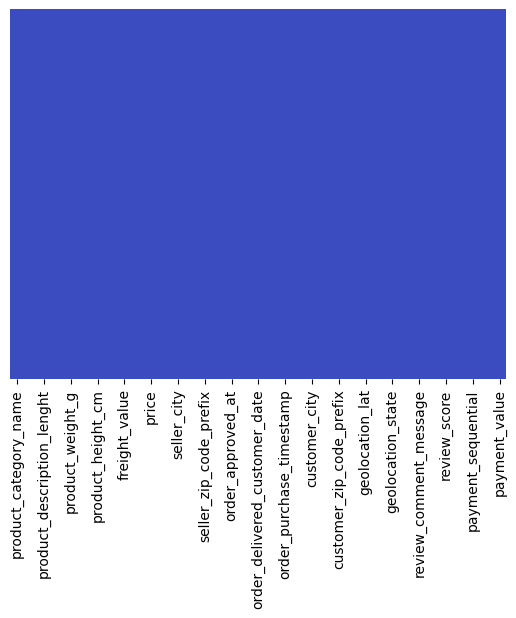

In [16]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='coolwarm')

In [17]:
df.duplicated().sum()

69197

In [18]:
df.drop_duplicates(inplace=True)

In [19]:
df.duplicated().sum()

0

In [20]:
df_interact(df)

interactive(children=(IntSlider(value=0, description='row', max=149392, step=5), IntSlider(value=0, descriptio…

(149392 rows, 37 columns) total


In [21]:
df["seller_zip_code_prefix"]=df["seller_zip_code_prefix"].str.lstrip("  ")
df

,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,freight_value,order_item_id,...,geolocation_lng,geolocation_state,review_answer_timestamp,review_comment_message,review_creation_date,review_score,payment_installments,payment_sequential,payment_type,payment_value
0,health_beauty,50,528,1,350,30,12,16,18.63,1,...,-43.360554,RJ,5/11/2018 16:46,Foi ruim pq eu tive q buscar no correio o prod...,5/11/2018 0:00,2,6,1,credit_card,168.25
1,health_beauty,50,528,1,350,30,12,16,18.63,1,...,-43.360875,RJ,5/11/2018 16:46,Foi ruim pq eu tive q buscar no correio o prod...,5/11/2018 0:00,2,6,1,credit_card,168.25
2,health_beauty,50,528,1,350,30,12,16,18.63,1,...,-43.365292,RJ,5/11/2018 16:46,Foi ruim pq eu tive q buscar no correio o prod...,5/11/2018 0:00,2,6,1,credit_card,168.25
3,health_beauty,50,528,1,350,30,12,16,18.63,1,...,-43.361190,RJ,5/11/2018 16:46,Foi ruim pq eu tive q buscar no correio o prod...,5/11/2018 0:00,2,6,1,credit_card,168.25
5,health_beauty,50,528,1,350,30,12,16,18.63,1,...,-43.360967,RJ,5/11/2018 16:46,Foi ruim pq eu tive q buscar no correio o prod...,5/11/2018 0:00,2,6,1,credit_card,168.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
509932,computers_accessories,46,2604,2,5879,30,25,19,17.51,1,...,-52.232327,RS,12/22/2017 12:08,"Vendedor ágil e prestativo, porém entrega dos ...",12/22/2017 0:00,5,10,1,credit_card,267.01
509933,computers_accessories,46,2604,2,5879,30,25,19,17.51,1,...,-52.225743,RS,12/22/2017 12:08,"Vendedor ágil e prestativo, porém entrega dos ...",12/22/2017 0:00,5,10,1,credit_card,267.01
509934,computers_accessories,46,2604,2,5879,30,25,19,17.51,1,...,-52.223206,RS,12/22/2017 12:08,"Vendedor ágil e prestativo, porém entrega dos ...",12/22/2017 0:00,5,10,1,credit_card,267.01
509935,computers_accessories,46,2604,2,5879,30,25,19,17.51,1,...,-52.222879,RS,12/22/2017 12:08,"Vendedor ágil e prestativo, porém entrega dos ...",12/22/2017 0:00,5,10,1,credit_card,267.01


In [22]:
# remove "" from column 
df['seller_zip_code_prefix'] = df['seller_zip_code_prefix'].str.replace('"', '')
df['customer_zip_code_prefix'] = df['customer_zip_code_prefix'].str.replace('"', '')

df_interact(df)

interactive(children=(IntSlider(value=0, description='row', max=149392, step=5), IntSlider(value=0, descriptio…

(149392 rows, 37 columns) total


In [23]:
# change data type 
df["seller_zip_code_prefix"]=df["seller_zip_code_prefix"].astype(int)
df["customer_zip_code_prefix"]=df["customer_zip_code_prefix"].astype(int)




In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 149392 entries, 0 to 509936
Data columns (total 37 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   product_category_name          149392 non-null  object 
 1   product_name_lenght            149392 non-null  int64  
 2   product_description_lenght     149392 non-null  int64  
 3   product_photos_qty             149392 non-null  int64  
 4   product_weight_g               149392 non-null  int64  
 5   product_length_cm              149392 non-null  int64  
 6   product_height_cm              149392 non-null  int64  
 7   product_width_cm               149392 non-null  int64  
 8   freight_value                  149392 non-null  float64
 9   order_item_id                  149392 non-null  int64  
 10  price                          149392 non-null  float64
 11  shipping_limit_date            149392 non-null  object 
 12  seller_city                   

In [25]:
columns_to_convert = ['review_creation_date', 'order_estimated_delivery_date', 'order_delivered_customer_date', 'order_delivered_carrier_date','order_approved_at','shipping_limit_date','order_purchase_timestamp','review_answer_timestamp']
for col in columns_to_convert:
    df[col] = pd.to_datetime(df[col])


In [26]:
df.dtypes

product_category_name                    object
product_name_lenght                       int64
product_description_lenght                int64
product_photos_qty                        int64
product_weight_g                          int64
product_length_cm                         int64
product_height_cm                         int64
product_width_cm                          int64
freight_value                           float64
order_item_id                             int64
price                                   float64
shipping_limit_date              datetime64[ns]
seller_city                              object
seller_state                             object
seller_zip_code_prefix                    int32
customer_id                              object
order_approved_at                datetime64[ns]
order_delivered_carrier_date     datetime64[ns]
order_delivered_customer_date    datetime64[ns]
order_estimated_delivery_date    datetime64[ns]
order_purchase_timestamp         datetim

In [27]:
df['order_status'].value_counts()

delivered     145256
canceled        1725
shipped         1283
invoiced         754
processing       374
Name: order_status, dtype: int64

In [28]:
df['customer_state'].value_counts()

SP    50206
MG    38274
RJ    25236
SC     7459
PR     6689
RS     6329
BA     3078
ES     3064
PE     1444
GO     1027
CE      908
MA      839
PA      812
AL      670
MT      603
MS      570
DF      557
PB      299
TO      263
RN      261
RO      247
SE      183
PI      175
AC      130
AM       43
RR       26
Name: customer_state, dtype: int64

# EDA

In [29]:
df.sample()

,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,freight_value,order_item_id,...,geolocation_lng,geolocation_state,review_answer_timestamp,review_comment_message,review_creation_date,review_score,payment_installments,payment_sequential,payment_type,payment_value
204896,fashion_underwear_beach,52,624,1,200,42,4,14,13.08,1,...,-46.31004,SP,2018-08-23 13:20:00,Produto não foi entregue!,2018-08-23,1,1,1,credit_card,72.98


<Axes: >

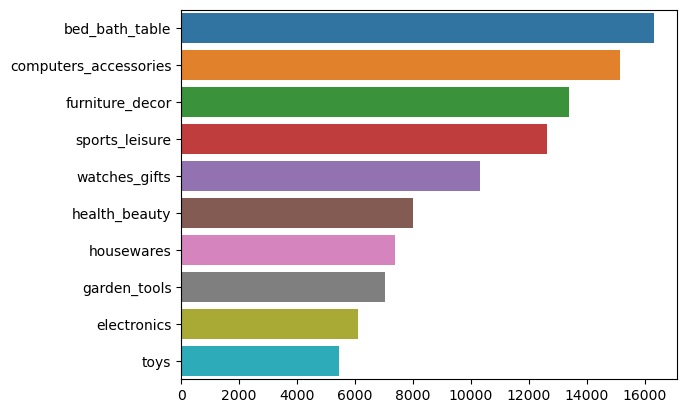

In [30]:

#Univariate Analysis:
# top  10  product category  sales by frequancy 
Top_product_category = df['product_category_name'].value_counts().head(10)

sns.barplot(x=Top_product_category.values,y=Top_product_category.index)



In [31]:
df.columns

Index(['product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'freight_value', 'order_item_id', 'price', 'shipping_limit_date',
       'seller_city', 'seller_state', 'seller_zip_code_prefix', 'customer_id',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'order_purchase_timestamp', 'order_status', 'customer_city',
       'customer_state', 'customer_zip_code_prefix', 'geolocation_city',
       'geolocation_lat', 'geolocation_lng', 'geolocation_state',
       'review_answer_timestamp', 'review_comment_message',
       'review_creation_date', 'review_score', 'payment_installments',
       'payment_sequential', 'payment_type', 'payment_value'],
      dtype='object')

In [32]:
#percentage of type of order status
ep = df['order_status'].value_counts().reset_index()
ep.columns = [
    'order_status', 
    'percent'
]
ep['percent'] /= len(df)

fig = px.pie(
    ep, 
    names='order_status', 
    values='percent', 
    title='Countplot of order_status', 
    width=600,
    height=500 )

fig.show()

In [33]:
#distribution of review score
px.histogram(df,x='review_score')

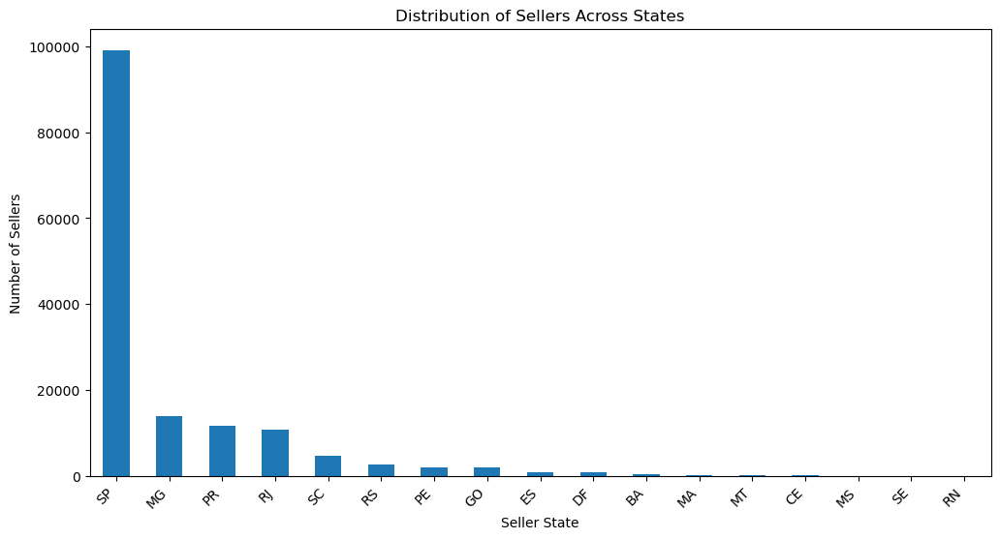

In [34]:
#barchar for seller_state 
plt.figure(figsize=(12, 6))
df['seller_state'].value_counts().plot(kind='bar'
                                      )
plt.title('Distribution of Sellers Across States')
plt.xlabel('Seller State')
plt.ylabel('Number of Sellers')
plt.xticks(rotation=45, ha='right')
plt.show()

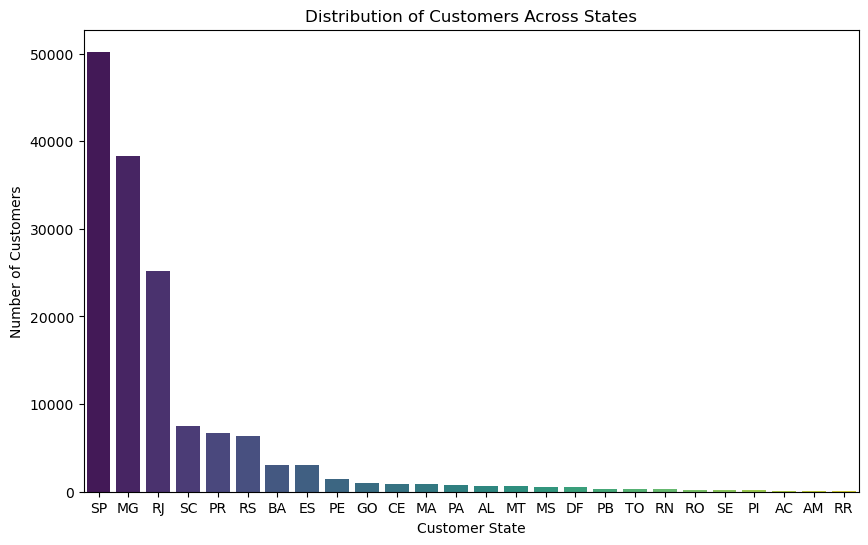

In [35]:
#How are customers distributed across different states?
# Create a count plot to visualize the distribution of customers across states
plt.figure(figsize=(10, 6))
sns.countplot(x='customer_state', data=df, order=df['customer_state'].value_counts().index, palette='viridis')
plt.title('Distribution of Customers Across States')
plt.xlabel('Customer State')
plt.ylabel('Number of Customers')
plt.show()


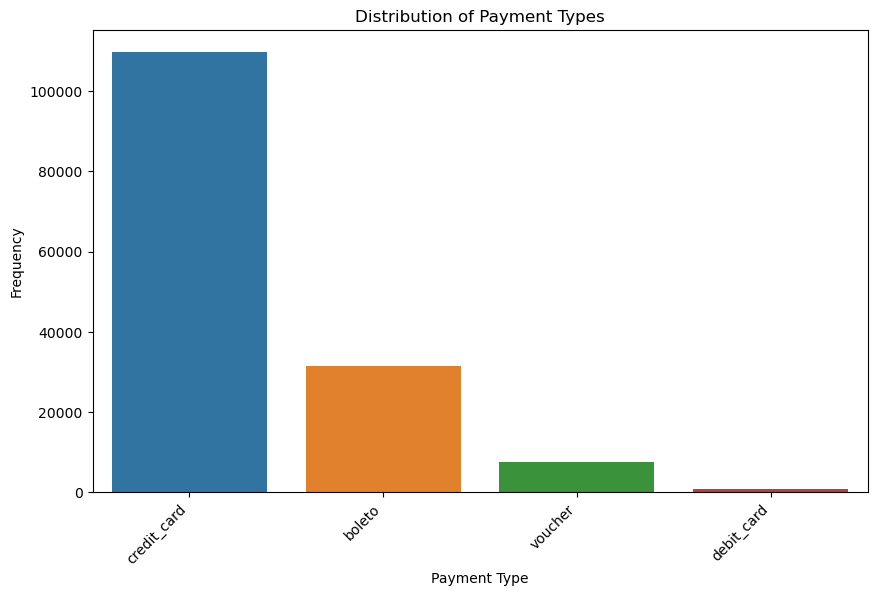

In [36]:
#What are the common payment types used by customers?
payment_counts = df['payment_type'].value_counts()
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='payment_type', order=payment_counts.index)
plt.title('Distribution of Payment Types')
plt.xlabel('Payment Type')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')  
plt.show()

In [37]:
df.columns

Index(['product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'freight_value', 'order_item_id', 'price', 'shipping_limit_date',
       'seller_city', 'seller_state', 'seller_zip_code_prefix', 'customer_id',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'order_purchase_timestamp', 'order_status', 'customer_city',
       'customer_state', 'customer_zip_code_prefix', 'geolocation_city',
       'geolocation_lat', 'geolocation_lng', 'geolocation_state',
       'review_answer_timestamp', 'review_comment_message',
       'review_creation_date', 'review_score', 'payment_installments',
       'payment_sequential', 'payment_type', 'payment_value'],
      dtype='object')

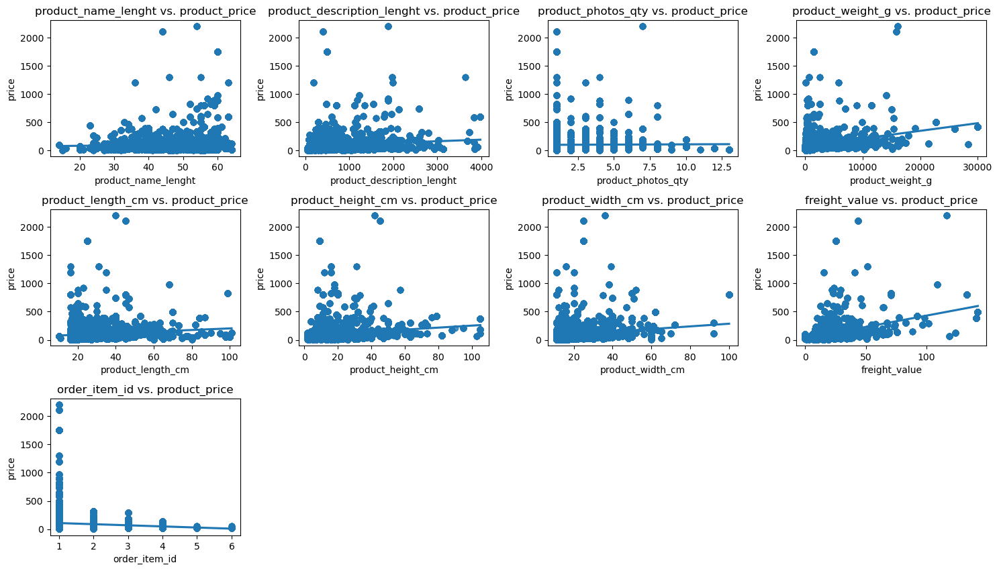

In [38]:
#bivariate Analysis:
#Is there a correlation between the price of procuct and another features of products?
numerical_features = ['product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm',
                      'product_height_cm', 'product_width_cm', 'freight_value', 'order_item_id']
plt.figure(figsize=(15, 11))
for feature in numerical_features:
    plt.subplot(4, 4, numerical_features.index(feature) + 1)
    sns.regplot(data=df, x=feature, y='price')
    plt.title(f'{feature} vs. product_price')
plt.tight_layout()
plt.show()


In [39]:
#realtionship between  payment_value and Number of Installments  
correlation = df['payment_value'].corr(df['payment_installments'])
print(f"Correlation between payment value and number of installments: {correlation}")
px.scatter(df,x="payment_value",y="payment_installments",width=600)


Correlation between payment value and number of installments: 0.37717463167787824


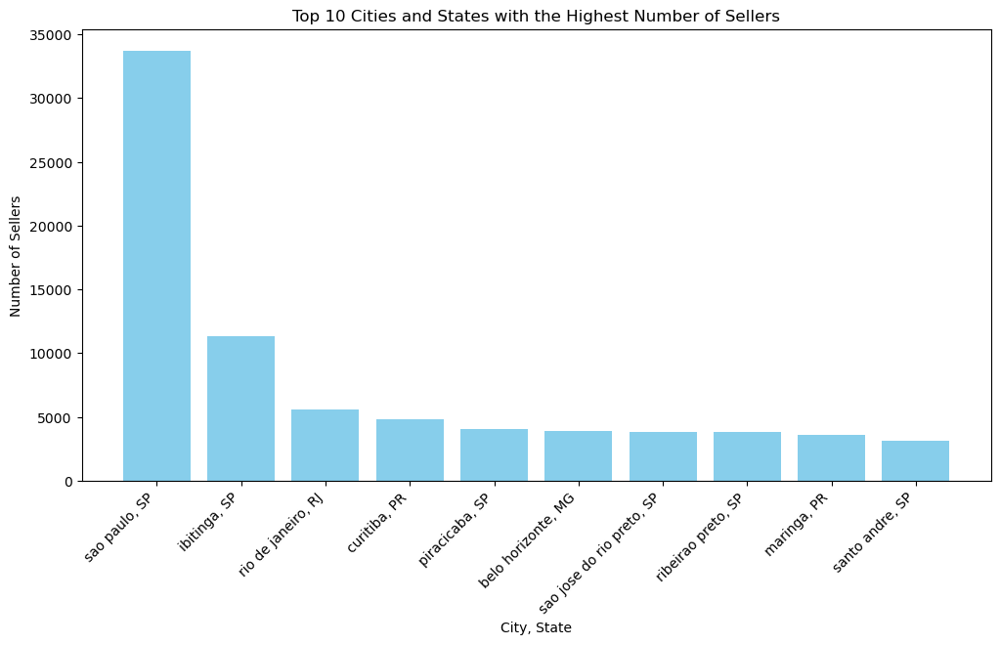

In [40]:
#Which cities and states have the highest number of sellers?
# Group by 'seller_city' and 'seller_state' and count the number of sellers in each city and state
seller_counts = df.groupby(['seller_city', 'seller_state']).size().reset_index(name='seller_count')
# Find the top 10 cities and states with the highest number of sellers
top_sellers = seller_counts.sort_values(by='seller_count', ascending=False).head(10)
top_sellers['seller_city'] = top_sellers['seller_city'].astype(str)
top_sellers['seller_state'] = top_sellers['seller_state'].astype(str)
# Plotting the bar chart
plt.figure(figsize=(12, 6))
plt.bar(top_sellers['seller_city'] + ', ' + top_sellers['seller_state'], top_sellers['seller_count'], color='skyblue')
plt.xlabel('City, State')
plt.ylabel('Number of Sellers')
plt.title('Top 10 Cities and States with the Highest Number of Sellers')
plt.xticks(rotation=45, ha='right')
plt.show()


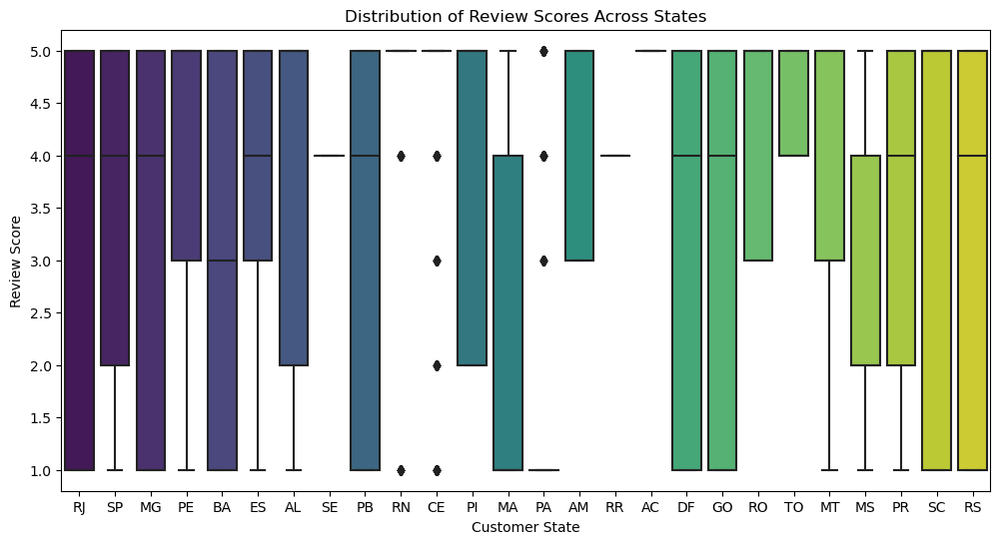

In [41]:
#whats state have higher review scores from customers?
plt.figure(figsize=(12, 6))
sns.boxplot(x='customer_state', y='review_score', data=df, palette='viridis')
plt.title('Distribution of Review Scores Across States')
plt.xlabel('Customer State')
plt.ylabel('Review Score')
plt.show()

In [ ]:
map_center = [df['geolocation_lat'].mean(), df['geolocation_lng'].mean()]
mymap = folium.Map(location=map_center, zoom_start=5)
for index, row in df.iterrows():
    folium.Marker(
      location=[row['geolocation_lat'], row['geolocation_lng']],
        popup=f"Review Score: {row['review_score']}",
      icon=folium.Icon(color='blue' if row['review_score'] > 3 else 'red') 
       # # Customize marker color based on review score
   ).add_to(mymap)

# Display the map
mymap

In [ ]:
# wahts is top  10  product category  sales by price  ?
avg_prices_by_product = df.groupby('product_category_name')['price'].max().sort_values(ascending=False)
top_product_category = avg_prices_by_product.head(10)
plt.figure(figsize=(10, 6))
sns.barplot(x=top_product_category.values, y=top_product_category.index)
plt.title(f'Top 10 product_category by max Price')
plt.xlabel('Average Price')
plt.ylabel('product_category')
plt.tight_layout()
plt.show()

In [ ]:
#How does the order status correlate with review scores?

plt.figure(figsize=(12, 6))
sns.boxplot(x='order_status', y='review_score', data=df, palette='viridis')
plt.title('Comparison of Review Scores Across Order Statuses')
plt.xlabel('Order Status')
plt.ylabel('Review Score')
plt.show()
# Calculate the correlation coefficient
correlation_coefficient = df['order_status'].str.get_dummies().corrwith(df['review_score'])
print(f'Correlation Coefficient: {correlation_coefficient}')

In [ ]:
df['shipping_time'] = df['order_delivered_customer_date'] - df['order_approved_at']

# Calculate the average shipping time
average_shipping_time = df['shipping_time'].mean()

print(f'The average shipping time is: {average_shipping_time}')

In [ ]:
# Calculate the percentage of positive reviews by score review not by comment 
positive_threshold = 4
positive_reviews_percentage = (df['review_score'] >= positive_threshold).mean() * 100
# Create a bar plot
plt.figure(figsize=(8, 6))
df['review_score'].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title('Distribution of Review Scores')
plt.xlabel('Review Score')
plt.ylabel('Number of Reviews')
# Annotate the percentage of positive reviews
plt.annotate(f'Positive Reviews: {positive_reviews_percentage:.2f}%', 
             xy=(positive_threshold - 0.2, df['review_score'].value_counts().max() * 0.8),
             color='darkred', fontsize=12)
plt.show()

    product_category_name        price  review_score  combined_score
12  computers_accessories  9296.597669      -3335.50     6770.178135
58          watches_gifts  8219.689448      -3086.50     5958.451558
57                   toys  5061.586626       -790.75     3891.119301
17             cool_stuff  4882.570798       -268.25     3852.406638
4                    auto  4796.554969       -212.50     3794.743975
32           garden_tools  3717.725890       -859.00     2802.380712
33          health_beauty  2994.558282       -133.00     2369.046626
53         sports_leisure  2624.561718        990.75     2297.799374
46       office_furniture  2777.962454        -30.50     2216.269963
35      home_appliances_2  2404.183190       -258.50     1871.646552


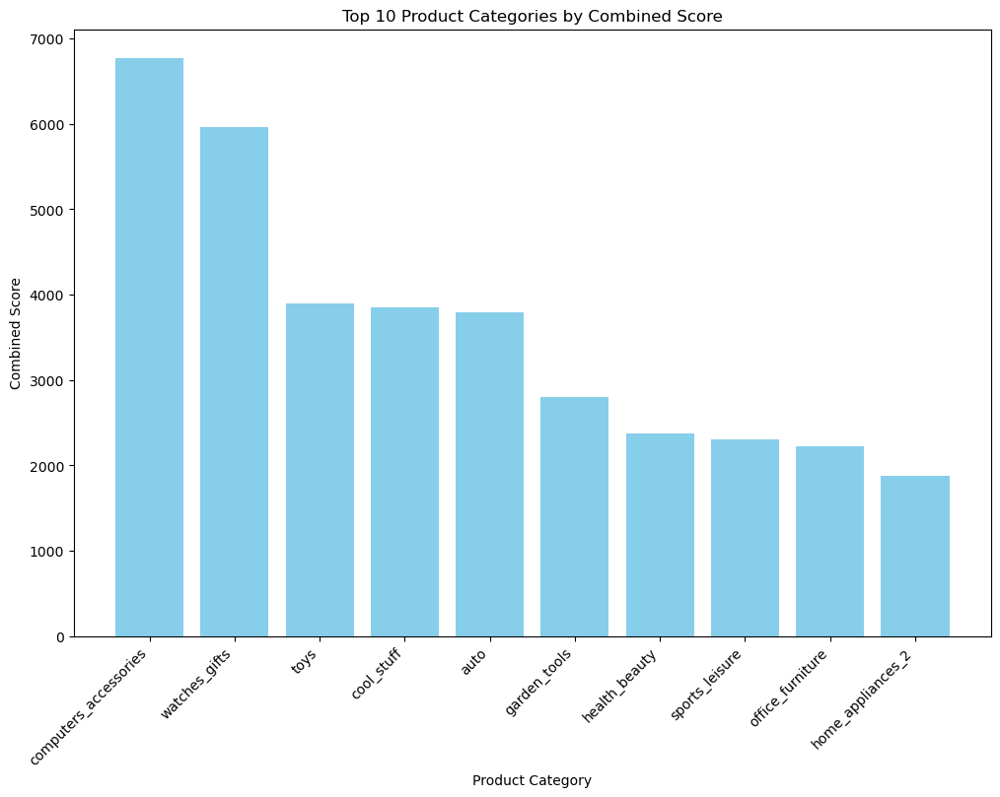

In [85]:
#Multivariate Analysis:
# Group by product category and calculate the sum of prices and review scores
category_sales_review = df.groupby('product_category_name').agg({'price': 'sum', 'review_score': 'sum'}).reset_index()
# Calculate a combined score (e.g., weighted sum of price and review score)
category_sales_review['combined_score'] = 0.8 * category_sales_review['price'] + 0.2 * category_sales_review['review_score']
top_categories = category_sales_review.sort_values(by='combined_score', ascending=False).head(10)
# Display the top 10 categories
print(top_categories[['product_category_name', 'price', 'review_score', 'combined_score']])
plt.figure(figsize=(12, 8))
# Create a bar chart
plt.bar(top_categories['product_category_name'], top_categories['combined_score'], color='skyblue')
plt.title('Top 10 Product Categories by Combined Score')
plt.xlabel('Product Category')
plt.ylabel('Combined Score')
plt.xticks(rotation=45, ha='right')

plt.show()

In [90]:
from folium.plugins import MarkerCluster
map_center = [df['geolocation_lat'].mean(), df['geolocation_lng'].mean()]  
my_map = folium.Map(location=map_center, zoom_start=10)
marker_cluster = MarkerCluster().add_to(my_map)

for index, row in df.iterrows():
    folium.Marker(
        location=[row['geolocation_lng'], row['geolocation_lat']],
        popup=f"Review Score: {row['review_score']}",
        icon=None  
    ).add_to(marker_cluster)
my_map.save('review_score_map.html')


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


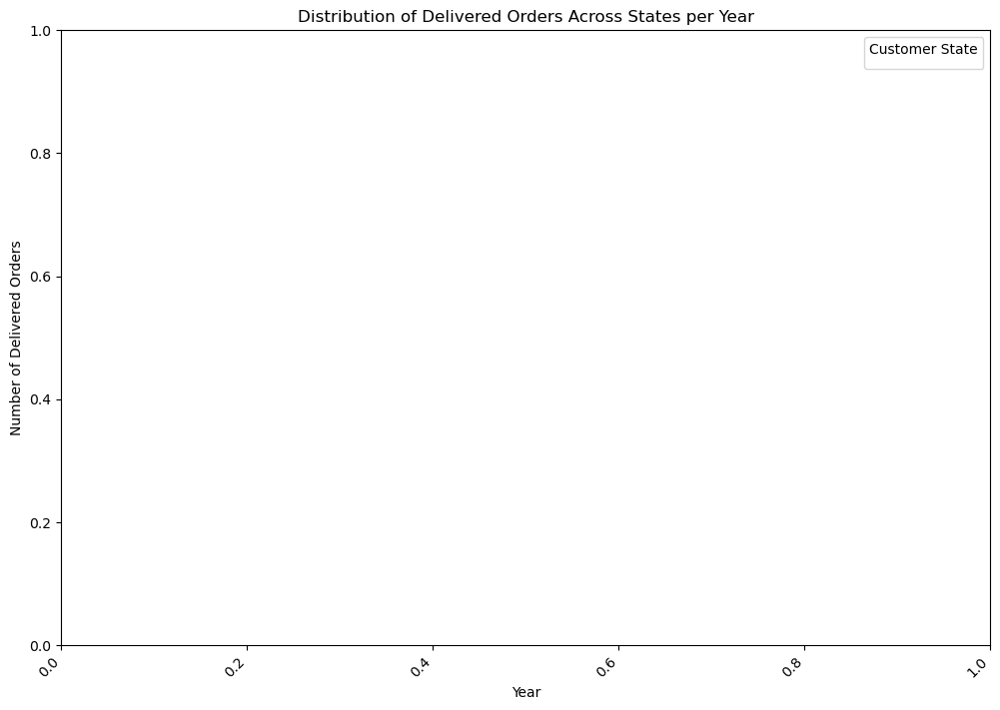

In [91]:
delivered_orders = df[df['order_status'] == 'delivered']

# Extract the year from the 'order_delivered_customer_date' column
delivered_orders['order_delivered_customer_year'] = delivered_orders['order_delivered_customer_date'].dt.year

# Set the size of the plot
plt.figure(figsize=(12, 8))

# Create an area plot using Seaborn
sns.lineplot(x='order_delivered_customer_year', y='count', hue='customer_state', data=delivered_orders.groupby(['order_delivered_customer_year', 'customer_state']).size().reset_index(name='count'), marker='o', sort=False)

# Customize the plot
plt.title('Distribution of Delivered Orders Across States per Year')
plt.xlabel('Year')
plt.ylabel('Number of Delivered Orders')
plt.legend(title='Customer State')
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.show()

C:\Users\midoel3ila\AppData\Local\Temp\ipykernel_15512\1750589605.py:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

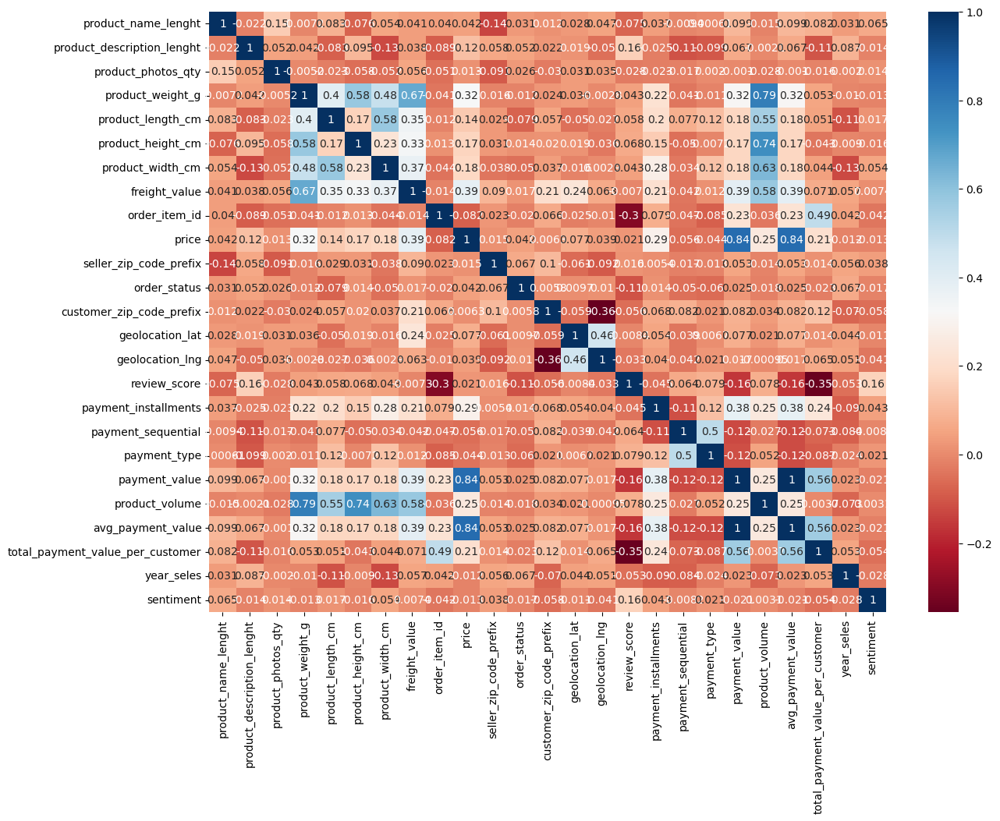

In [92]:
#correaltion matrex
plt.figure(figsize=(14,10))
sns.heatmap(df.corr(),cmap= "RdBu",annot=True)

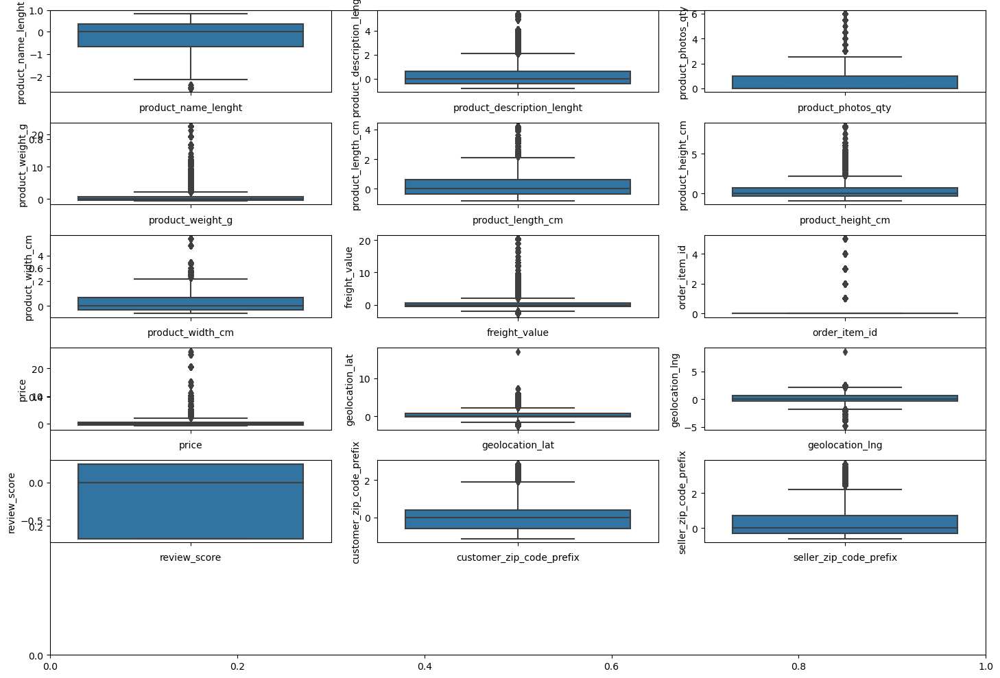

In [93]:
# Visualize boxplots for each numeric variable
numeric_columns  = ['product_name_lenght', 'product_description_lenght',
       'product_photos_qty', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm', 'freight_value',
       'order_item_id', 'price', 'geolocation_lat', 'geolocation_lng',
       'review_score','customer_zip_code_prefix','seller_zip_code_prefix']
fg, ax = plt.subplots(figsize=(15, 10))
for i, col in enumerate(numeric_columns):
    fg.add_subplot(6, 3,i+1)
    sns.boxplot(y=df[col])
    plt.xlabel(col)
plt.tight_layout()
plt.show()

# Data preprocessing 

In [94]:
df.columns

Index(['product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'freight_value', 'order_item_id', 'price', 'shipping_limit_date',
       'seller_city', 'seller_state', 'seller_zip_code_prefix', 'customer_id',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'order_purchase_timestamp', 'order_status', 'customer_city',
       'customer_state', 'customer_zip_code_prefix', 'geolocation_city',
       'geolocation_lat', 'geolocation_lng', 'geolocation_state',
       'review_answer_timestamp', 'review_comment_message',
       'review_creation_date', 'review_score', 'payment_installments',
       'payment_sequential', 'payment_type', 'payment_value', 'shipping_time',
       'product_volume', 'avg_payment_value',
       'total_payment_value_per_customer', 'year_

In [95]:
#Feature engineering 
#Add product volume 
df['product_volume'] = df['product_length_cm'] * df['product_width_cm'] * df['product_height_cm']
#Add average of payment value 
df['avg_payment_value'] = df.groupby('customer_id')['payment_value'].transform('mean')
## Total payment value per customer
df['total_payment_value_per_customer'] = df.groupby('customer_id')['payment_value'].transform('sum')
df_interact(df)


interactive(children=(IntSlider(value=0, description='row', max=149392, step=5), IntSlider(value=0, descriptio…

(149392 rows, 45 columns) total


In [96]:
#label encoding 
cat_columns=["order_status","payment_type"]
# Encoding categorical variables
label_encoder = LabelEncoder()
for column in cat_columns:
    df[column] = label_encoder.fit_transform(df[column])
    

In [97]:
df_interact(df)

interactive(children=(IntSlider(value=0, description='row', max=149392, step=5), IntSlider(value=0, descriptio…

(149392 rows, 45 columns) total


In [98]:
#Using pca to reduce dimetion and reduce multicorenality 
dfcopy=df.copy()
numerical_data = ['product_name_lenght', 'product_description_lenght',
       'product_photos_qty', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm', 'freight_value',
       'order_item_id', 'price', 'geolocation_lat', 'geolocation_lng',
       'review_score','customer_zip_code_prefix','seller_zip_code_prefix']
#Transormation data using standerdscaler 
scaler=RobustScaler()
df[numerical_data] = scaler.fit_transform(df[numerical_data])
#Using PCA to 
pca = PCA()
new_df = pca.fit_transform(df[numerical_data])
pd.DataFrame(new_df)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,-0.895614,0.869089,0.337622,0.506780,-0.709212,-0.345642,0.328153,0.063813,-1.049352,-0.124472,-0.165875,-0.269603,-0.206294,-0.412215,-0.393543
1,-0.895585,0.869229,0.337401,0.507056,-0.709053,-0.345526,0.328279,0.063739,-1.049167,-0.124446,-0.165765,-0.269413,-0.206236,-0.412214,-0.393548
2,-0.895537,0.869423,0.337067,0.507287,-0.708864,-0.345146,0.328541,0.063568,-1.048760,-0.124436,-0.165190,-0.268402,-0.205972,-0.412185,-0.393583
3,-0.895595,0.869178,0.337478,0.506939,-0.709114,-0.345544,0.328243,0.063758,-1.049218,-0.124458,-0.165759,-0.269401,-0.206237,-0.412211,-0.393549
4,-0.895604,0.869133,0.337551,0.506854,-0.709165,-0.345589,0.328199,0.063784,-1.049283,-0.124466,-0.165808,-0.269485,-0.206261,-0.412213,-0.393547
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149387,2.768388,-0.654375,2.750721,-2.121976,-0.484493,2.932007,-0.807118,-2.061728,0.762715,0.103868,-0.098682,-0.419130,-0.025976,-0.230932,0.137897
149388,2.768375,-0.654358,2.750741,-2.121692,-0.484421,2.931655,-0.807252,-2.061622,0.762485,0.103914,-0.099375,-0.420354,-0.026278,-0.230977,0.137941
149389,2.768465,-0.653863,2.749986,-2.120577,-0.483826,2.931863,-0.806891,-2.061818,0.762999,0.104029,-0.099378,-0.420373,-0.026248,-0.230997,0.137947
149390,2.768442,-0.653977,2.750166,-2.120799,-0.483956,2.931765,-0.806995,-2.061757,0.762846,0.104009,-0.099475,-0.420541,-0.026298,-0.230999,0.137952


# Time Series Analysis

In [99]:
sales=df.groupby('order_purchase_timestamp')[['payment_value']].sum()
sales

,payment_value
order_purchase_timestamp,
2016-10-03 22:51:00,56376.97
2016-10-04 22:15:00,3731.22
2016-10-04 23:08:00,123199.44
2016-10-04 23:45:00,13574.40
2016-10-06 09:22:00,56793.85
...,...
2018-08-24 10:25:00,33608.96
2018-08-26 11:44:00,23433.96
2018-08-27 16:24:00,1074.31


<Axes: xlabel='order_purchase_timestamp'>

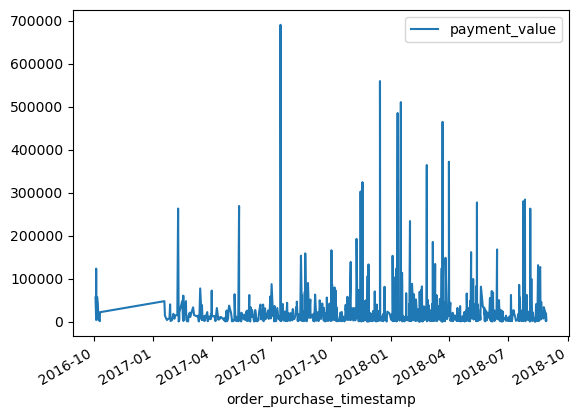

In [100]:
sales.plot()

In [101]:
sales.index

DatetimeIndex(['2016-10-03 22:51:00', '2016-10-04 22:15:00',
               '2016-10-04 23:08:00', '2016-10-04 23:45:00',
               '2016-10-06 09:22:00', '2016-10-07 11:20:00',
               '2016-10-08 09:50:00', '2016-10-10 07:03:00',
               '2016-10-10 11:08:00', '2016-10-10 12:54:00',
               ...
               '2018-08-20 12:37:00', '2018-08-20 17:09:00',
               '2018-08-21 10:22:00', '2018-08-23 15:48:00',
               '2018-08-23 21:25:00', '2018-08-24 10:25:00',
               '2018-08-26 11:44:00', '2018-08-27 16:24:00',
               '2018-08-27 21:27:00', '2018-08-28 13:29:00'],
              dtype='datetime64[ns]', name='order_purchase_timestamp', length=1082, freq=None)

In [102]:
sales['day_name']=sales.index.day_name()
sales

,payment_value,day_name
order_purchase_timestamp,,
2016-10-03 22:51:00,56376.97,Monday
2016-10-04 22:15:00,3731.22,Tuesday
2016-10-04 23:08:00,123199.44,Tuesday
2016-10-04 23:45:00,13574.40,Tuesday
2016-10-06 09:22:00,56793.85,Thursday
...,...,...
2018-08-24 10:25:00,33608.96,Friday
2018-08-26 11:44:00,23433.96,Sunday
2018-08-27 16:24:00,1074.31,Monday


In [103]:
sales['day_name'].value_counts()

Monday       185
Wednesday    167
Tuesday      162
Friday       153
Thursday     141
Sunday       138
Saturday     136
Name: day_name, dtype: int64

day_name
Friday       3577765.72
Monday       3219584.43
Saturday     3804469.77
Sunday       2899311.88
Thursday     3036935.36
Tuesday      4251765.78
Wednesday    3358922.77
Name: payment_value, dtype: float64

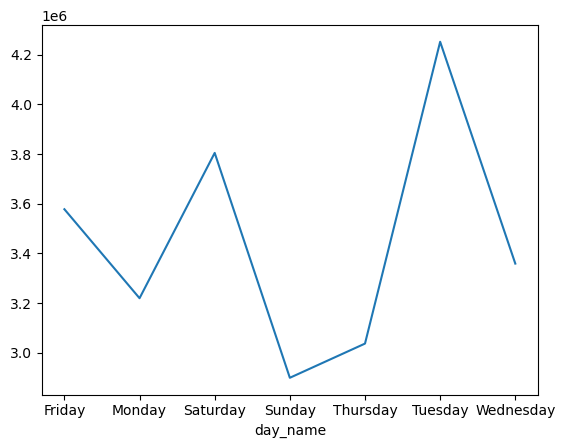

In [104]:
#which day have most payment_value 
total_per_day = sales.groupby('day_name')['payment_value'].sum()
total_per_day.plot()
total_per_day



In [105]:
sales['month_name']=sales.index.month_name()
sales


,payment_value,day_name,month_name
order_purchase_timestamp,,,
2016-10-03 22:51:00,56376.97,Monday,October
2016-10-04 22:15:00,3731.22,Tuesday,October
2016-10-04 23:08:00,123199.44,Tuesday,October
2016-10-04 23:45:00,13574.40,Tuesday,October
2016-10-06 09:22:00,56793.85,Thursday,October
...,...,...,...
2018-08-24 10:25:00,33608.96,Friday,August
2018-08-26 11:44:00,23433.96,Sunday,August
2018-08-27 16:24:00,1074.31,Monday,August


In [106]:
df['year_seles'] = df['order_purchase_timestamp'].dt.year
df['month_seles'] = df['order_purchase_timestamp'].dt.month_name()

C:\Users\midoel3ila\AppData\Local\Temp\ipykernel_15512\1645555732.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



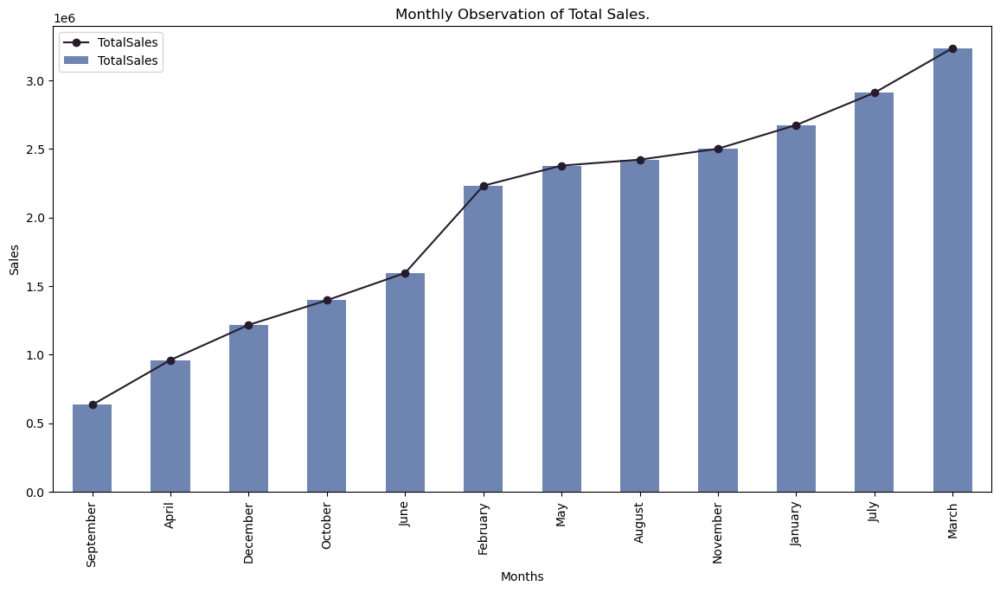

In [107]:
# Monthly observation of Sales Pattern.
monthSales_data = df.groupby(by='month_seles').sum()['payment_value']
monthSales_data = monthSales_data.sort_values()

# plot
monthSales_data.plot(kind='line', figsize=(14, 7), color="#261C2C", marker='o', label='TotalSales')
monthSales_data.plot(kind='bar', figsize=(14, 7), color="#6E85B2", label='TotalSales')

plt.xlabel('Months')
plt.ylabel("Sales")
plt.title("Monthly Observation of Total Sales.")

plt.legend()
plt.show()

In [108]:
df_1 = df.groupby('year_seles')[['month_seles']].value_counts().unstack().T
df_1

year_seles,2016,2017,2018
month_seles,,,
April,NaN,2986.0,5231.0
August,NaN,6536.0,7422.0
December,NaN,5717.0,NaN
February,NaN,3344.0,11723.0
January,NaN,1489.0,13632.0
July,NaN,6611.0,9671.0
June,NaN,4794.0,8988.0
March,NaN,3423.0,15824.0
May,NaN,5616.0,7968.0


C:\Users\midoel3ila\AppData\Local\Temp\ipykernel_15512\142759258.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,payment_value
order_purchase_timestamp,
2016-10-09,301135.76
2016-10-16,27873.22
2016-10-23,0.00
2016-10-30,0.00
2016-11-06,0.00
...,...
2018-08-05,551073.43
2018-08-12,163953.37
2018-08-19,528809.61


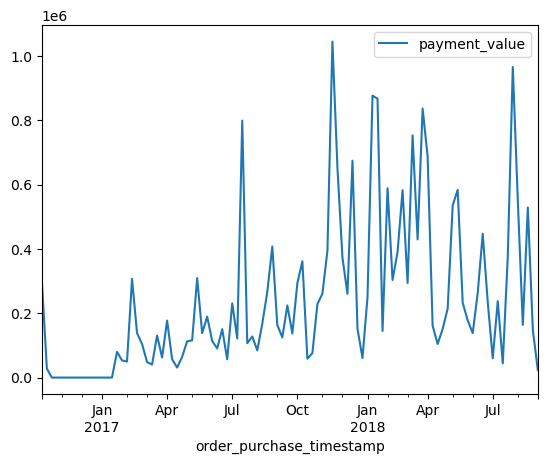

In [109]:
#Resampling
weekly_date = (sales.resample("1W").sum())
weekly_date.plot()
weekly_date

C:\Users\midoel3ila\AppData\Local\Temp\ipykernel_15512\1893821295.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,payment_value
order_purchase_timestamp,
2016-10-31,329008.98
2016-11-30,0.00
2016-12-31,0.00
2017-01-31,161623.99
2017-02-28,571125.22
2017-03-31,459239.65
2017-04-30,265437.41
2017-05-31,798431.78
2017-06-30,509285.55


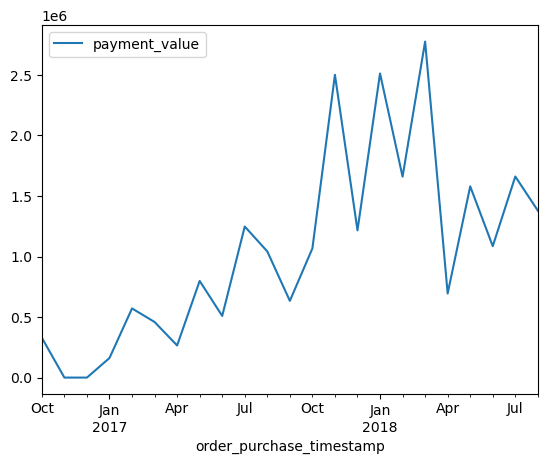

In [110]:
monthly_date = (sales.resample("1m").sum())
monthly_date.plot()
monthly_date

# preprocessing on text 

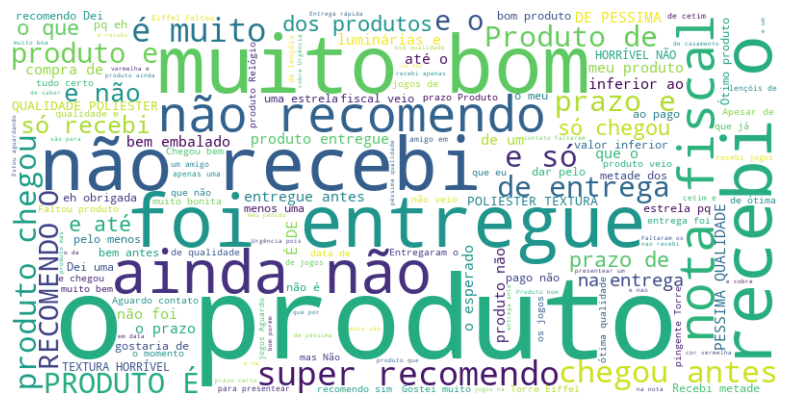

In [111]:
from wordcloud import WordCloud
all_comments = ' '.join(df['review_comment_message'].dropna())
wordcloud = WordCloud(width=800, height=400, max_words=150, background_color='white').generate(all_comments)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


In [112]:
from textblob import TextBlob

df['sentiment'] = df['review_comment_message'].apply(lambda x: TextBlob(str(x)).sentiment.polarity)
df['sentiment'].value_counts()

 0.000000    137768
 0.333333      5334
 0.416667      1295
 0.500000      1166
 0.375000       704
-0.100000       674
 0.050000       438
-0.200000       383
 0.200000       334
 0.125000       244
 0.187500       181
 1.000000       145
-0.800000       129
 0.520833       102
 0.573568        73
-0.750000        68
 0.437500        67
 0.625000        65
 0.377778        60
-0.250000        51
 0.150000        50
 0.900000        48
 0.468750        13
Name: sentiment, dtype: int64

In [113]:
# Convert sentiment scores to positive and negative labels
threshold = 0.0
df['sentiment_label'] = df['sentiment'].apply(lambda x: 'Positive' if x > threshold else 'Negative')

In [ ]:
text_df = df[['review_comment_message','sentiment_label']]
text_df.sample()

In [ ]:
#compare between negative review and postive review 
ep = df['sentiment_label'].value_counts().reset_index()
ep.columns = [
    'sentiment_label', 
    'percent'
]
ep['percent'] /= len(df)

fig = px.pie(
    ep, 
    names='sentiment_label', 
    values='percent', 
    title='precentage of sentiment', 
    width=600,
    height=500 )

fig.show()

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()

x = cv.fit_transform(text_df.review_comment_message)
x.shape

In [ ]:
cv.vocabulary_

In [ ]:
x.toarray()

In [ ]:
#import nltk and stopwords of portuguese
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

nltk.download('stopwords')
def remove_sw(text):
    sw=stopwords.words('portuguese')
    tokens = word_tokenize(text)
    text = ' '.join([word for word in tokens if word not in sw])
    return text

In [ ]:
text_df['clean_text'] = text_df['review_comment_message'].apply(remove_sw)
text_df.head()

In [ ]:

len(cv.vocabulary_)

In [ ]:
import re 
def denoise(text):
  text = re.sub('[^A-Za-z]+',' ',text)
  return text

In [ ]:
text='Produto bom. 00Se for realmente o que diz77, trata...	'
denoise(text)

In [ ]:
text_df['clean_text'] = text_df.review_comment_message.apply(denoise)
text_df['clean_text'] = text_df.clean_text.apply(remove_sw)
text_df.head()

In [ ]:
#nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer
lm = WordNetLemmatizer()

def stem(text):
  clean_text = []
  for word in text.split():
    clean_text.append(ps.stem(word))
  return ' '.join(clean_text)

def lemmatize(text):
  clean_text = []
  for word in text.split():
    clean_text.append(lm.lemmatize(word, pos ="v"))
  return ' '.join(clean_text)

In [ ]:
lemmatize('Foi ruim pq eu tive q buscar no correio o produto e depois vi por mais barato em outros sites. Entأ£o, pesquisaria mt antes de comprar. ')

In [ ]:
#apply all methods for text 
text_df['clean_text'] = text_df.review_comment_message.apply(denoise)
text_df['clean_text'] = text_df.clean_text.apply(remove_sw)
text_df['clean_text'] = text_df.clean_text.apply(lemmatize)

text_df.head()